In [1]:
import pandas as pd
import scanpy as sc
import omicverse as ov
import seaborn as sns
import matplotlib.pyplot as plt

sc.set_figure_params(dpi=100, frameon=False, figsize=(5,5), facecolor='white', dpi_save=300)

In [3]:
# Read data
sc_adata = sc.read_h5ad('./Results_h5ad/02_scRNA_hDRG_ready.h5ad')
sc_adata_raw = sc.read_h5ad('./Results_h5ad/hDRG_scRNA_raw.h5ad')
bk_adata = sc.read_h5ad('./Results_h5ad/01_bulk_hDRG_ready.h5ad')

In [4]:
# Get the TPM count layer
bk_adata.X = bk_adata.layers['counts'].copy()
bk_adata.X = bk_adata.X/10000
bulk = bk_adata.to_df().T

In [7]:
obs_keep = sc_adata_raw.obs_names.intersection(sc_adata.obs_names)

sc_adata = sc_adata[obs_keep].copy()
sc_adata = sc_adata.raw.to_adata()
sc_adata_raw = sc_adata_raw[obs_keep].copy()

In [8]:
sc_adata.var_names = sc_adata.var_names.str.upper()
sc_adata_raw.var_names = sc_adata_raw.var_names.str.upper()

var_keep = sc_adata_raw.var_names.intersection(sc_adata.var_names)

sc_adata = sc_adata[:,var_keep].copy()
sc_adata_raw = sc_adata_raw[:,var_keep].copy()

In [9]:
sc_adata.X = sc_adata_raw.layers['counts'].copy()
del sc_adata_raw

In [10]:
# Construct a pain_state dictionary to hold bulk sample ids of different conditions
pain_state = {}

for i in bk_adata.obs['pain state'].unique():
    pain_state[i] = bk_adata.obs[bk_adata.obs['pain state'] == i].index.to_list()

......random select 9714 single cells
Reading single-cell dataset, this may take 1 min
Reading dataset is done
Normalizing raw single cell data with scanpy.pp.normalize_total
Generating cell fractions using Dirichlet distribution without prior info (actually random)
RANDOM cell fractions is generated
You set sparse as True, some cell's fraction will be zero, the probability is 0.5
Sampling cells to compose pseudo-bulk data


5000it [00:11, 416.78it/s]


Sampling is done
Reading training data
Reading is done
Reading test data
Reading test data is done
Using counts data to train model
Cutting variance...
Finding intersected genes...
Intersected gene number is  11050
Scaling...


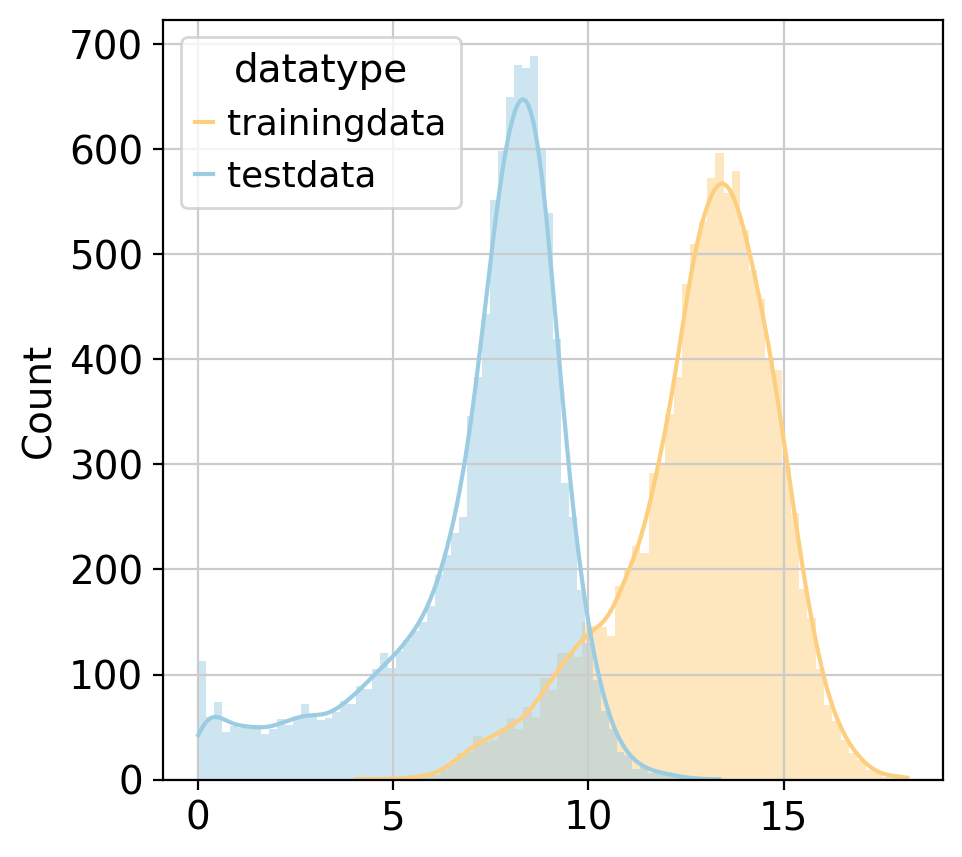

Using minmax scaler...


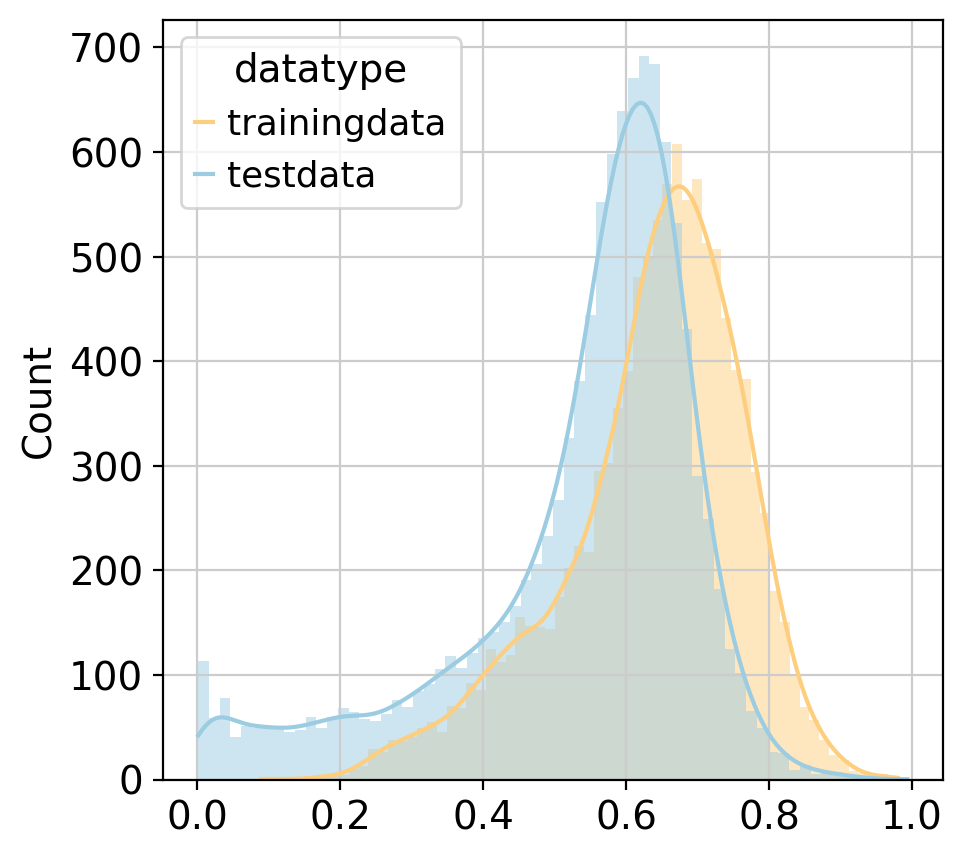

training data shape is  (5000, 11050) 
test data shape is  (50, 11050)
Start training


100%|██████████| 128/128 [00:56<00:00,  2.25it/s]

Training is done
prediction loss is:


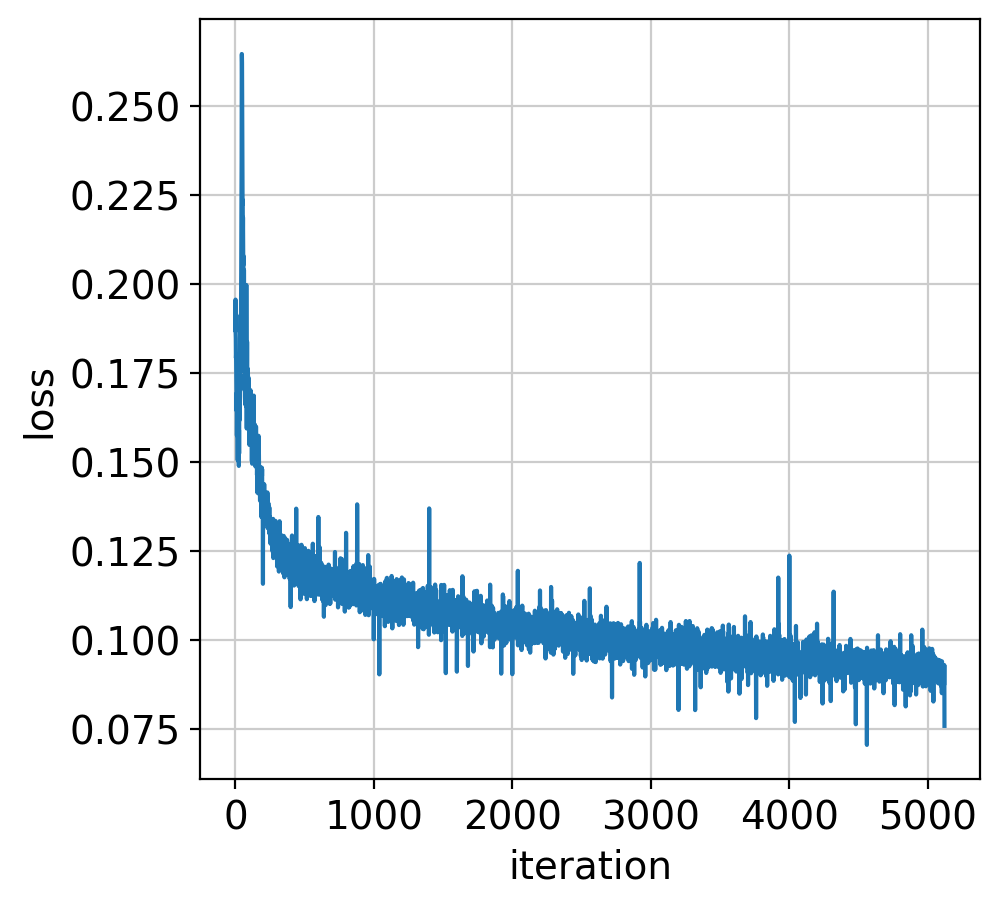

reconstruction loss is:


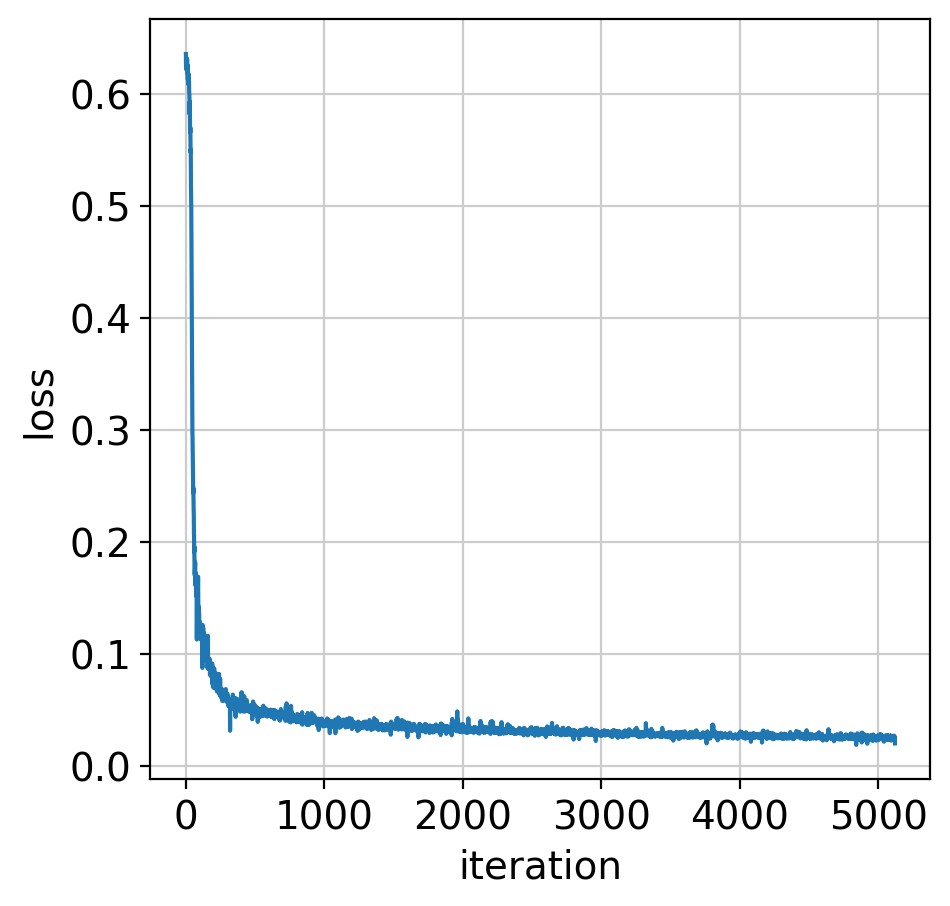

Notice that you are using parameters: mode=overall and adaptive=True
Model is saved without defined name
Start adaptive training for all the samples
Adaptive stage is done
Predicted Total Cell Num: 30907.276254608663
......drop duplicates index in bulk data
......deseq2 normalize the bulk data
......log10 the bulk data
......calculate the mean of each group
......normalize the single data
......log1p the single data
......prepare the input of bulk2single
...loading data
...begin vae training


Train Epoch: 3499: 100%|██████████| 3500/3500 [33:07<00:00,  1.76it/s, loss=3.3901, min_loss=3.3867]


min loss = 3.3867228776216507
...vae training done!
...save trained vae in ./bulk2single/N_model/N_vae.pth.
......random select 9714 single cells
Reading single-cell dataset, this may take 1 min
Reading dataset is done
Normalizing raw single cell data with scanpy.pp.normalize_total
Generating cell fractions using Dirichlet distribution without prior info (actually random)
RANDOM cell fractions is generated
You set sparse as True, some cell's fraction will be zero, the probability is 0.5
Sampling cells to compose pseudo-bulk data


5000it [00:11, 421.71it/s]


Sampling is done
Reading training data
Reading is done
Reading test data
Reading test data is done
Using counts data to train model
Cutting variance...
Finding intersected genes...
Intersected gene number is  11050
Scaling...


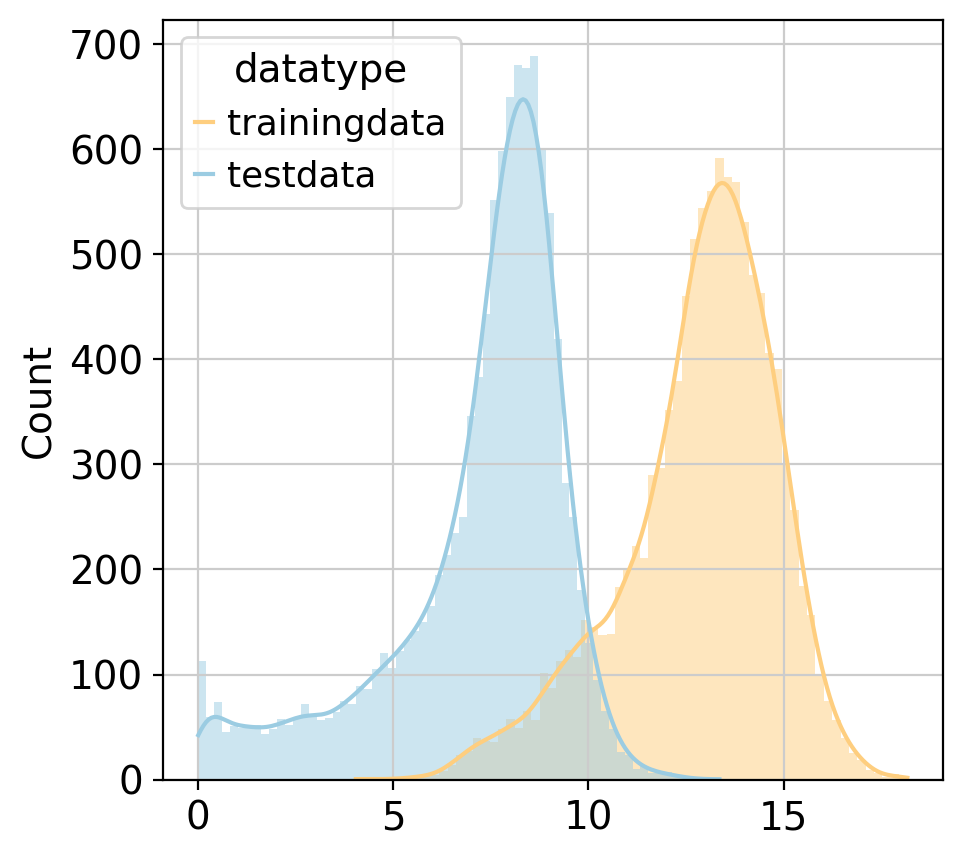

Using minmax scaler...


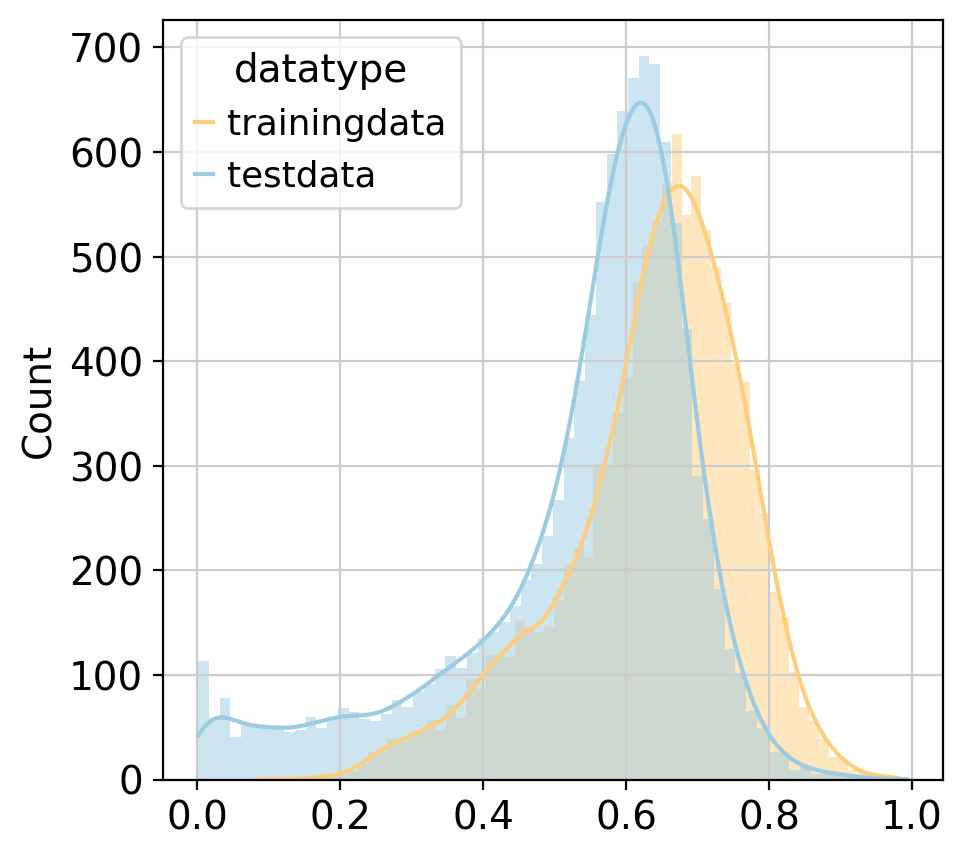

training data shape is  (5000, 11050) 
test data shape is  (50, 11050)
Start training


100%|██████████| 128/128 [00:56<00:00,  2.25it/s]

Training is done
prediction loss is:


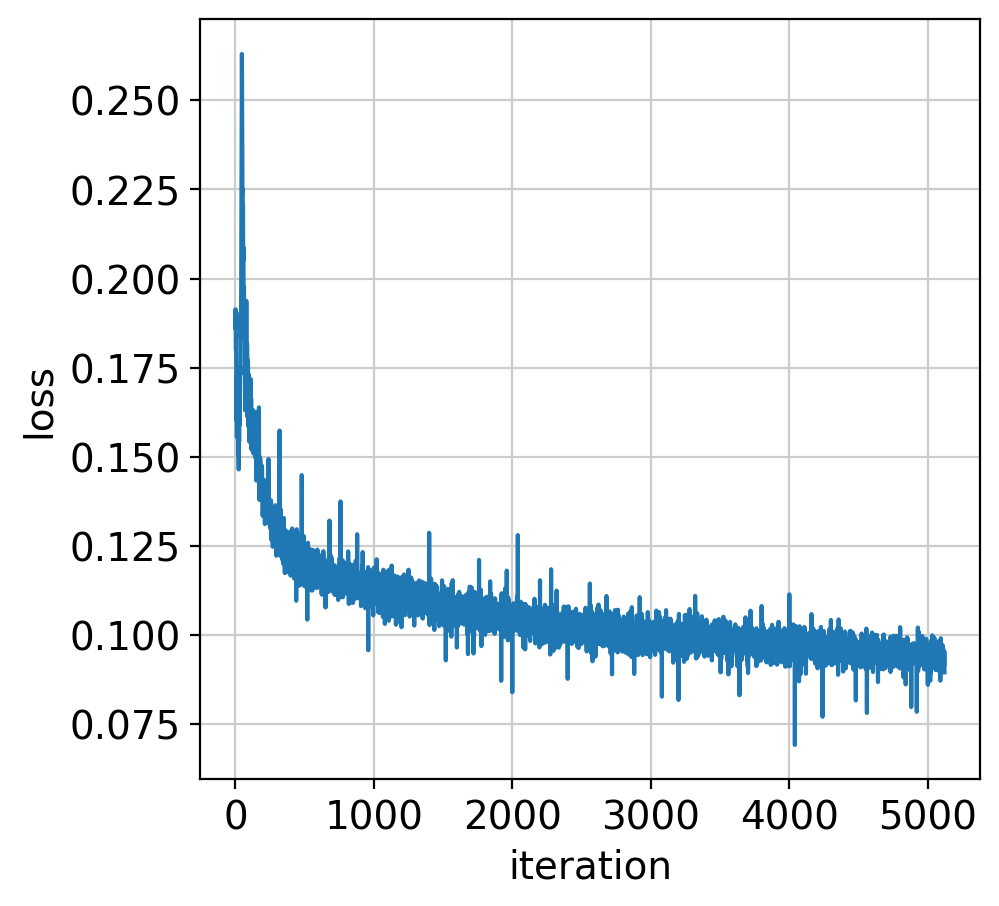

reconstruction loss is:


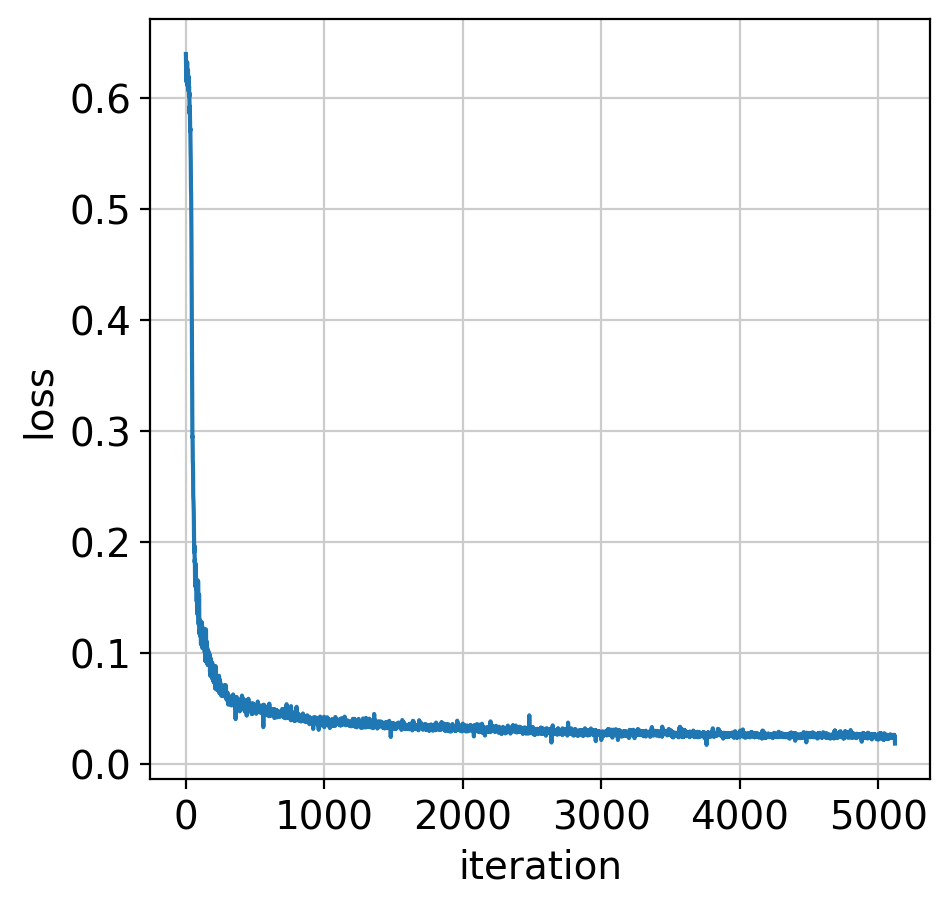

Notice that you are using parameters: mode=overall and adaptive=True
Model is saved without defined name
Start adaptive training for all the samples
Adaptive stage is done
Predicted Total Cell Num: 30550.34755847289
......drop duplicates index in bulk data
......deseq2 normalize the bulk data
......log10 the bulk data
......calculate the mean of each group
......normalize the single data
......log1p the single data
......prepare the input of bulk2single
...loading data
...begin vae training


Train Epoch: 3175:  91%|█████████ | 3176/3500 [36:15<03:41,  1.46it/s, loss=3.5905, min_loss=3.5882]

Early stopping at epoch 3177...
min loss = 3.5881811529397964
...vae training done!


...save trained vae in ./bulk2single/P_model/P_vae.pth.


In [11]:
# use ~30% of cells in single cell data

model_dict = {}

for k,v in pain_state.items():
    model=ov.bulk2single.Bulk2Single(bulk_data=bulk.copy(),single_data=sc_adata.copy(), max_single_cells=round(sc_adata.shape[0] * .1),
                                            celltype_key='NociceptiveType',bulk_group=v,top_marker_num=1000,ratio_num=1,gpu=0)
    GEP,CellFractionPrediction=model.predicted_fraction()
    model.bulk_preprocess_lazy()
    model.single_preprocess_lazy()
    model.prepare_input()
    vae_net=model.train(
                        batch_size=512,
                        learning_rate=1e-4,
                        hidden_size=256,
                        epoch_num=3500,
                        vae_save_dir=f'./bulk2single/{k}_model',
                        vae_save_name=f'{k}_vae',
                        generate_save_dir=f'./bulk2single/{k}_output',
                        generate_save_name=f'{k}'
                        )
    model_dict[k] = dict(model=model, GEP=GEP, CellFractionPrediction=CellFractionPrediction, vae_net=vae_net)

In [52]:
n_adata = model_dict['N']['model'].generate()
p_adata = model_dict['P']['model'].generate()

...generating


generating: 100%|██████████| 61811/61811 [00:03<00:00, 18177.56it/s]


generated done!
...generating


generating: 100%|██████████| 61097/61097 [00:03<00:00, 19203.47it/s]


generated done!


In [53]:
n_adata.obs['PainState'] = 'noPain'
p_adata.obs['PainState'] = 'Pain'

In [54]:
n_adata.write('./Results_h5ad/04_N_adata.h5ad')
p_adata.write('./Results_h5ad/04_P_adata.h5ad')

In [3]:
n_adata = sc.read_h5ad('./Results_h5ad/04_N_adata.h5ad')
p_adata = sc.read_h5ad('./Results_h5ad/04_P_adata.h5ad')

In [104]:
adata = sc.concat([n_adata,p_adata])

In [105]:
adata.obs.PainState = adata.obs.PainState.astype('category').cat.reorder_categories(['noPain','Pain'])

In [106]:
def filtered(generate_adata,highly_variable_genes:bool=True,max_value:float=10,
                     n_comps:int=100,svd_solver:str='auto',leiden_size:int=50):
        generate_adata.raw = generate_adata
        if highly_variable_genes:
            sc.pp.highly_variable_genes(generate_adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
            generate_adata = generate_adata[:, generate_adata.var.highly_variable]
        sc.pp.scale(generate_adata, max_value=max_value)
        sc.tl.pca(generate_adata, n_comps=n_comps, svd_solver=svd_solver)
        sc.pp.neighbors(generate_adata, use_rep="X_pca")
        sc.tl.leiden(generate_adata)
        filter_leiden=list(generate_adata.obs['leiden'].value_counts()[generate_adata.obs['leiden'].value_counts()<leiden_size].index)
        print("The filter leiden is ",filter_leiden)
        generate_adata=generate_adata[~generate_adata.obs['leiden'].isin(filter_leiden)]

        return generate_adata

In [107]:
adata = filtered(adata,leiden_size=900)
sc.tl.umap(adata)

The filter leiden is  ['24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '76', '75', '69', '73', '72', '71', '70', '74', '68', '66', '65', '64', '63', '62', '67', '106', '109', '108', '107', '103', '105', '104', '111', '102', '110', '115', '112', '113', '114', '116', '117', '118', '119', '120', '121', '100', '101', '85', '99', '87', '98', '79', '80', '81', '82', '83', '84', '77', '86', '78', '88', '94', '89', '96', '95', '97', '93', '92', '91', '90', '122', '123', '124', '125', '126', '145', '151', '146', '147', '148', '149', '150', '158', '152', '153', '154', '155', '156', '157', '143', '144', '135', '142', '133', '127', '141', '129', '130', '131', '132', '128', '134', '137', '138', '139', '140', '136', '176', '172', '173', '174', '175', '179', '177', '178', '180', '170', '171', '167', '169', '168', '159', '16

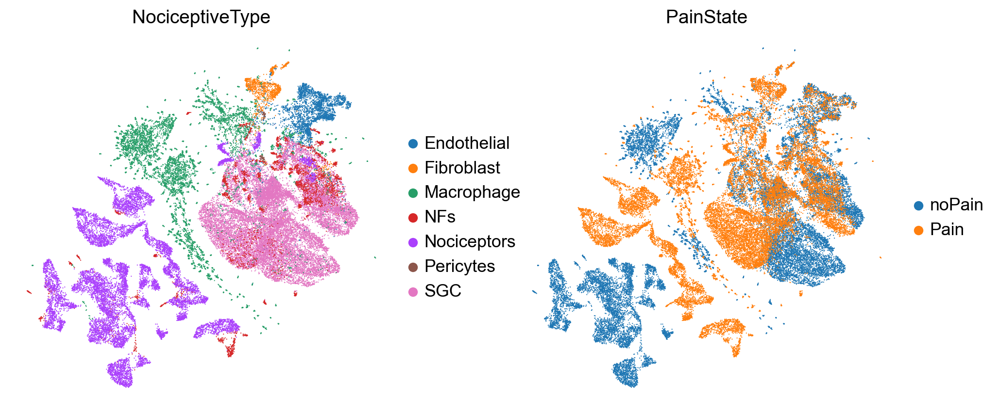

In [132]:
sc.pl.umap(adata, color=['NociceptiveType', 'PainState'], use_raw=True, wspace=0.2)

In [7]:
pal = dict(zip(adata.obs.NociceptiveType.cat.categories, list(sns.palettes.color_palette('Set1', n_colors=7).as_hex())))

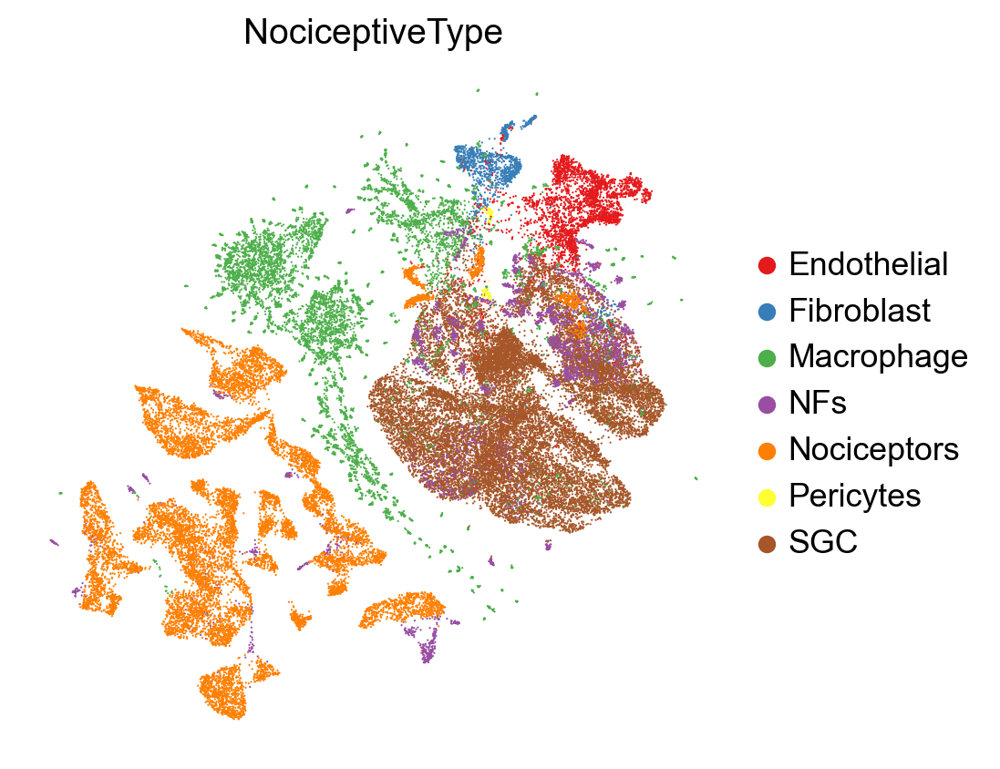

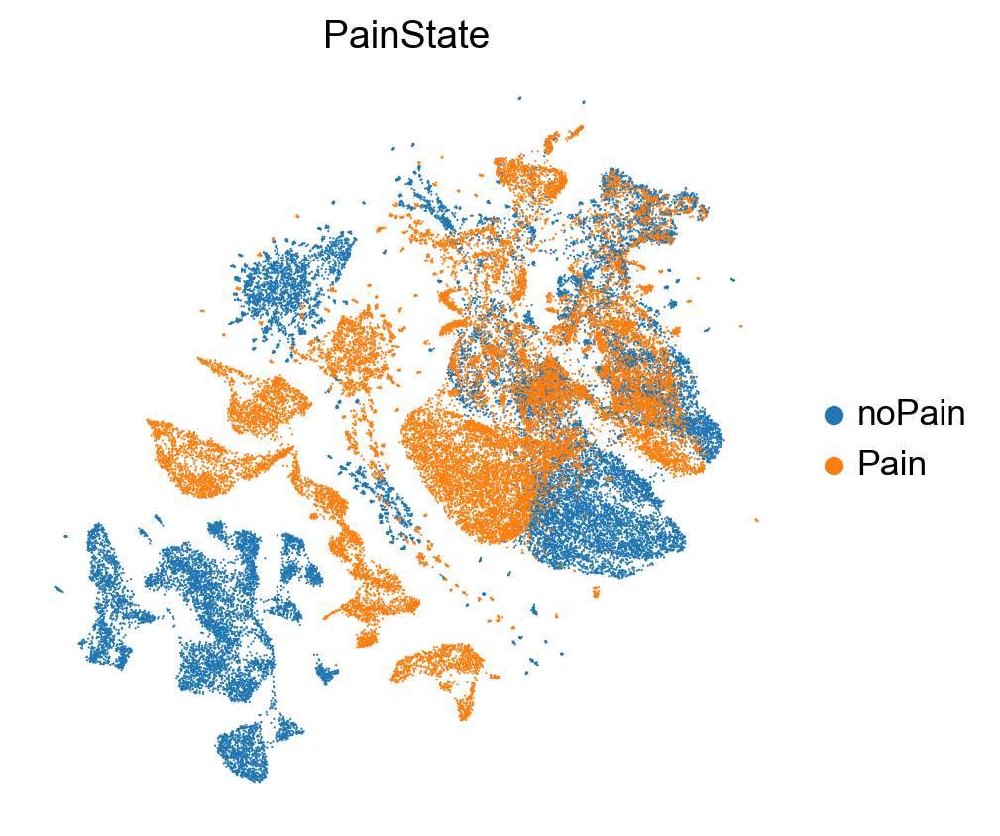

In [15]:
sc.set_figure_params(dpi=100, frameon=False, figsize=(5,5), facecolor='white', dpi_save=300)
sc.pl.umap(adata, color=['NociceptiveType'], use_raw=True, palette=pal, save='_NociceptiveType.pdf')
sc.pl.umap(adata, color=['PainState'], use_raw=True, save='_PainState.pdf')

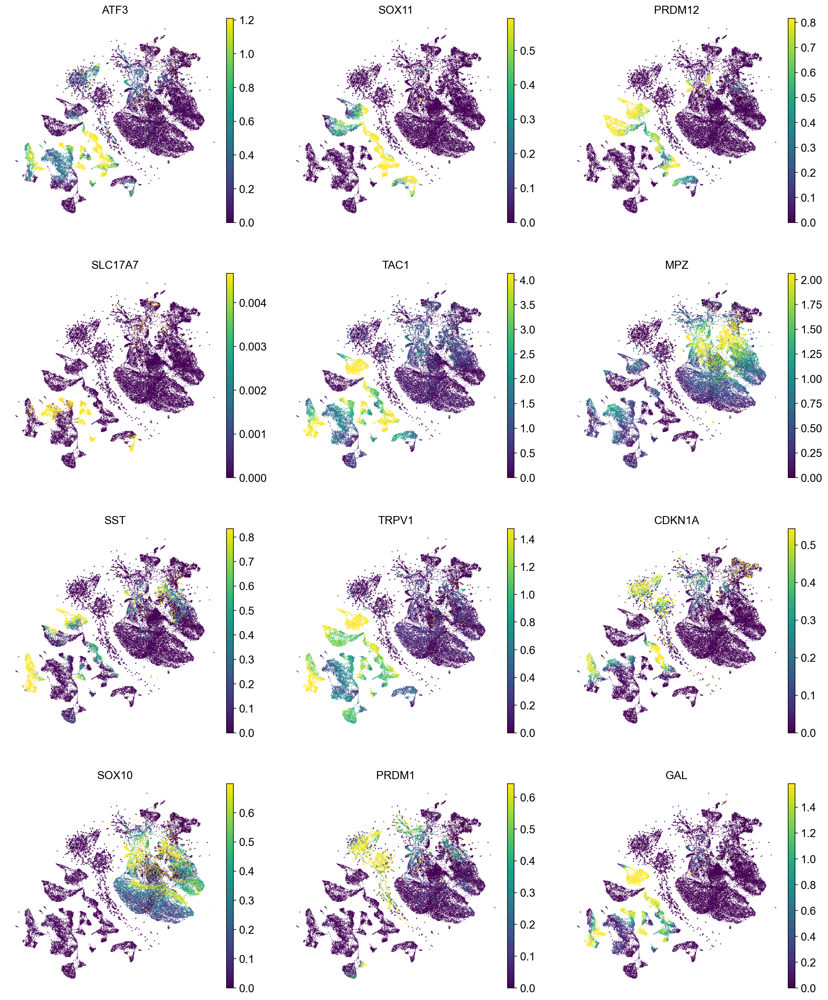

In [110]:
sc.pl.umap(adata, color=['ATF3', 'SOX11', 'PRDM12', 'SLC17A7', 'TAC1', 'MPZ', 'SST', 'TRPV1', 'CDKN1A', 'SOX10', 'PRDM1', 'GAL'], use_raw=True, ncols=3, vmax='p95')

In [111]:
adata.write_h5ad('./Results_h5ad/04_adata_concat.h5ad')

In [4]:
adata = sc.read('./Results_h5ad/04_adata_concat.h5ad')

In [112]:
adata_noci = adata[adata.obs.NociceptiveType == 'Nociceptors'].copy()

In [113]:
sc.pp.filter_genes(adata_noci, min_cells=10)

In [114]:
sc.pp.scale(adata_noci)
sc.tl.pca(adata_noci)
sc.pp.neighbors(adata_noci, n_neighbors=50, n_pcs=40)
sc.tl.umap(adata_noci)

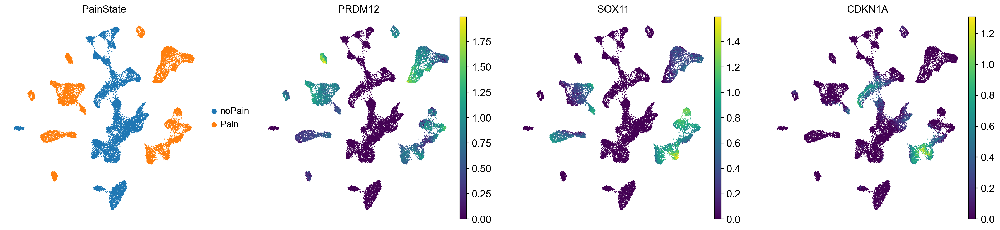

In [115]:
sc.pl.umap(adata_noci, color=['PainState','PRDM12','SOX11','CDKN1A'])

In [116]:
senmayo = pd.read_excel('./SenMayo.xlsx', sheet_name=0)
senmayo

,Gene(human),Classification,State,Reference
0,ACVR1B,Transmembrane signal receptors,Transmembrane,26
1,ANG,Miscellaneous,Secreted,"81,88"
2,ANGPT1,Intercellular signal molecule,Secreted,57
3,ANGPTL4,Intercellular signal molecule,Secreted,"18,57"
4,AREG,Growth factor,Intracellular,"81,88,89"
...,...,...,...,...
120,VEGFA,Growth factor,Secreted,"26,42,83,89"
121,VEGFC,Growth factor,Secreted,89
122,VGF,Intercellular signal molecule,Secreted,56
123,WNT16,Intercellular signal molecule,Secreted,57


In [117]:
sc.tl.score_genes(adata_noci, senmayo['Gene(human)'].to_list(), ctrl_size=len(senmayo['Gene(human)'].to_list()), score_name='SenMayo')
adata_noci.obs.SenMayo = (adata_noci.obs.SenMayo - adata_noci.obs.SenMayo.mean()) / adata_noci.obs.SenMayo.std() # scale the SenMayo score

In [121]:
from scipy import stats

a = adata_noci.obs.SenMayo[adata_noci.obs['PainState'] == 'noPain']
b = adata_noci.obs.SenMayo[adata_noci.obs['PainState'] == 'Pain']

In [122]:
# The distribution of the two groups were not normally distributed
stats.normaltest(a)[1], stats.normaltest(b)[1]

(2.014561784771878e-213, 9.467592515904976e-186)

In [123]:
# Non-parametric test was chosen
stats.mannwhitneyu(a, b, alternative='less')

MannwhitneyuResult(statistic=18370818.0, pvalue=3.545310050741201e-91)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


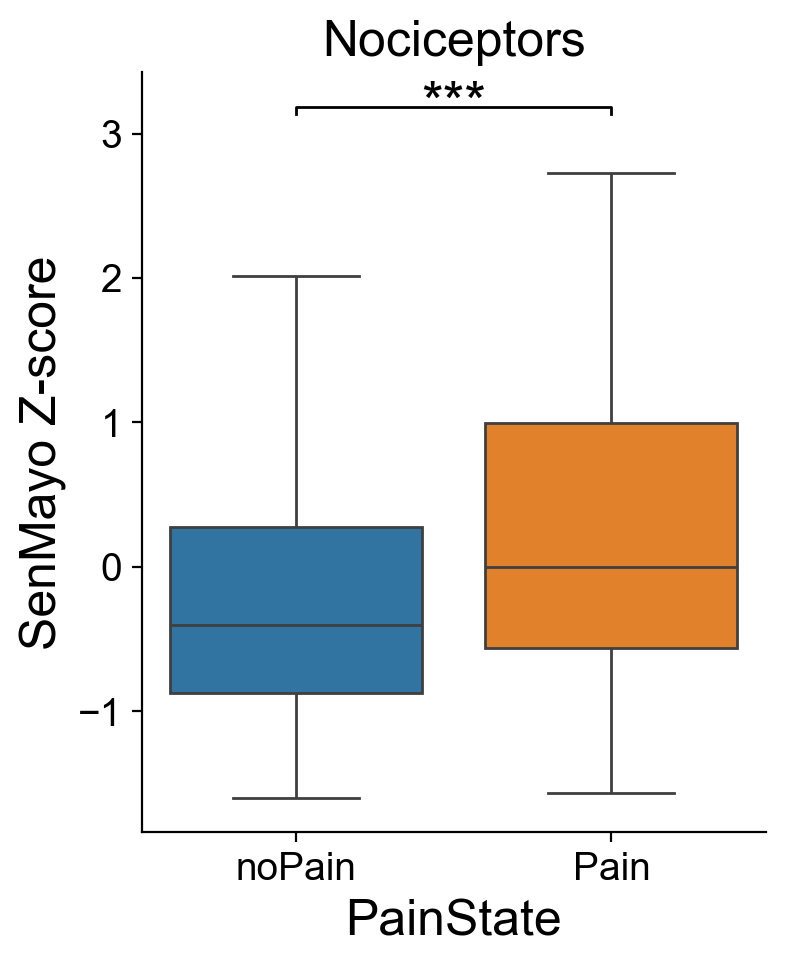

In [3]:
fig, ax = plt.subplots(figsize=(4,5))
sns.boxplot(x='PainState', y='SenMayo', data=adata_noci.obs, ax=ax, hue='PainState', showfliers=False)

max_val = max(adata_noci.obs.SenMayo)
plt.plot([0,0,1,1], [max_val+0.1, max_val+0.15, max_val+0.15, max_val+0.1], lw=1, c='k')
plt.text(0.5, max_val+0.15, '***', ha='center', va='center', fontsize=20)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# for axis in ['bottom','left']:
#     ax.spines[axis].set_linewidth(1.5)

# ax.tick_params(width=1.5)
ax.grid(False)
ax.set_xlabel('PainState', fontdict={'fontsize': 18, 'fontweight': 'medium'})
ax.set_ylabel('SenMayo Z-score', fontdict={'fontsize': 18, 'fontweight': 'medium'})
ax.legend(loc='upper right', bbox_to_anchor=(1.05,1), frameon=False)
ax.set_title('Nociceptors', fontdict={'fontsize': 18, 'fontweight': 'medium'})
fig.savefig('/Users/pax/Manu_fig/boxplot_hDRG_noci_decon_SenMayo.pdf')


In [125]:
adata_noci.write_h5ad('./Results_h5ad/04_adata_noci.h5ad')